In [1]:
# ============================================
# Import Libraries
# ============================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rcParams
import arabic_reshaper
from bidi.algorithm import get_display
import warnings
warnings.filterwarnings('ignore')

# Set style for beautiful plots
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('husl')

# For Farsi text in plots
def farsi(text):
    """Convert Farsi text for proper display in matplotlib"""
    reshaped = arabic_reshaper.reshape(text)
    return get_display(reshaped)

print("✅ Libraries loaded!")

✅ Libraries loaded!


In [2]:
# ============================================
# Load Cleaned Dataset
# ============================================

df = pd.read_csv('/Users/yashakhorsandi/Desktop/پروژه دیوار/tehran_properties_clean.csv')

print(f"📊 Dataset loaded: {df.shape[0]:,} properties × {df.shape[1]} features")
print(f"\n📅 Date range: {df['created_date_jalali'].min()} to {df['created_date_jalali'].max()}")

📊 Dataset loaded: 86,434 properties × 50 features

📅 Date range: 1401/07/09 to 1403/11/13


---
## 📊 Chapter 1: The Big Picture
### What does Tehran's property market look like?

In [9]:
# ============================================
# Key Statistics Overview
# ============================================

# Convert price to billion Toman for readability
df['price_billion'] = df['price_value'] / 1e10  # 1 billion Toman = 10^10 Rial
df['price_per_sqm_million'] = df['price_per_sqm'] / 1e7  # Million Toman per sqm

# Key stats
total_listings = len(df)
apartments = (df['cat3_slug'] == 'apartment-sell').sum()
villas = (df['cat3_slug'] == 'villa-sell').sum()
neighborhoods = df['neighborhood_slug'].nunique()

median_price = df['price_billion'].median()
median_size = df['building_size'].median()
median_price_sqm = df['price_per_sqm_million'].median()

print("="*60)
print("           🏠 TEHRAN REAL ESTATE MARKET OVERVIEW")
print("="*60)
print(f"\n📈 Total Listings:        {total_listings:,}")
print(f"🏢 Apartments:            {apartments:,} ({apartments/total_listings*100:.1f}%)")
print(f"🏡 Villas:                {villas:,} ({villas/total_listings*100:.1f}%)")
print(f"📍 Neighborhoods:         {neighborhoods}")
print(f"\n💰 Median Price:          {median_price:.1f} Billion Toman")
print(f"📐 Median Size:           {median_size:.0f} sqm")
print(f"💵 Median Price/sqm:      {median_price_sqm:.0f} Million Toman")
print("="*60)

           🏠 TEHRAN REAL ESTATE MARKET OVERVIEW

📈 Total Listings:        86,434
🏢 Apartments:            83,104 (96.1%)
🏡 Villas:                0 (0.0%)
📍 Neighborhoods:         344

💰 Median Price:          0.7 Billion Toman
📐 Median Size:           83 sqm
💵 Median Price/sqm:      8 Million Toman


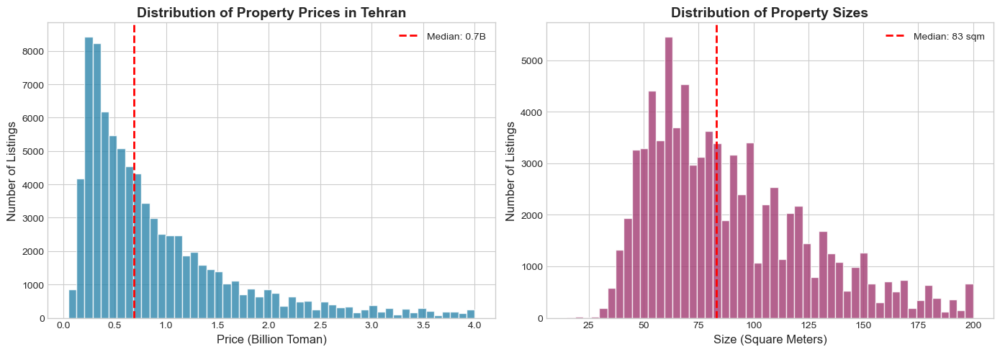

💡 Insight: Most properties are priced under 10 billion Toman, with sizes around 60-120 sqm


In [4]:
# ============================================
# Price Distribution
# ============================================

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Price distribution (capped for visualization)
price_cap = df['price_billion'].quantile(0.95)  # Cap at 95th percentile
ax1 = axes[0]
df[df['price_billion'] <= price_cap]['price_billion'].hist(bins=50, ax=ax1, color='#2E86AB', edgecolor='white', alpha=0.8)
ax1.axvline(median_price, color='red', linestyle='--', linewidth=2, label=f'Median: {median_price:.1f}B')
ax1.set_xlabel('Price (Billion Toman)', fontsize=12)
ax1.set_ylabel('Number of Listings', fontsize=12)
ax1.set_title('Distribution of Property Prices in Tehran', fontsize=14, fontweight='bold')
ax1.legend()

# Size distribution
size_cap = df['building_size'].quantile(0.95)
ax2 = axes[1]
df[df['building_size'] <= size_cap]['building_size'].hist(bins=50, ax=ax2, color='#A23B72', edgecolor='white', alpha=0.8)
ax2.axvline(median_size, color='red', linestyle='--', linewidth=2, label=f'Median: {median_size:.0f} sqm')
ax2.set_xlabel('Size (Square Meters)', fontsize=12)
ax2.set_ylabel('Number of Listings', fontsize=12)
ax2.set_title('Distribution of Property Sizes', fontsize=14, fontweight='bold')
ax2.legend()

plt.tight_layout()
plt.savefig('/Users/yashakhorsandi/Desktop/پروژه دیوار/viz_price_size_dist.png', dpi=150, bbox_inches='tight')
plt.show()

print("💡 Insight: Most properties are priced under 10 billion Toman, with sizes around 60-120 sqm")

---
## 📍 Chapter 2: Location, Location, Location
### Which neighborhoods are the most expensive?

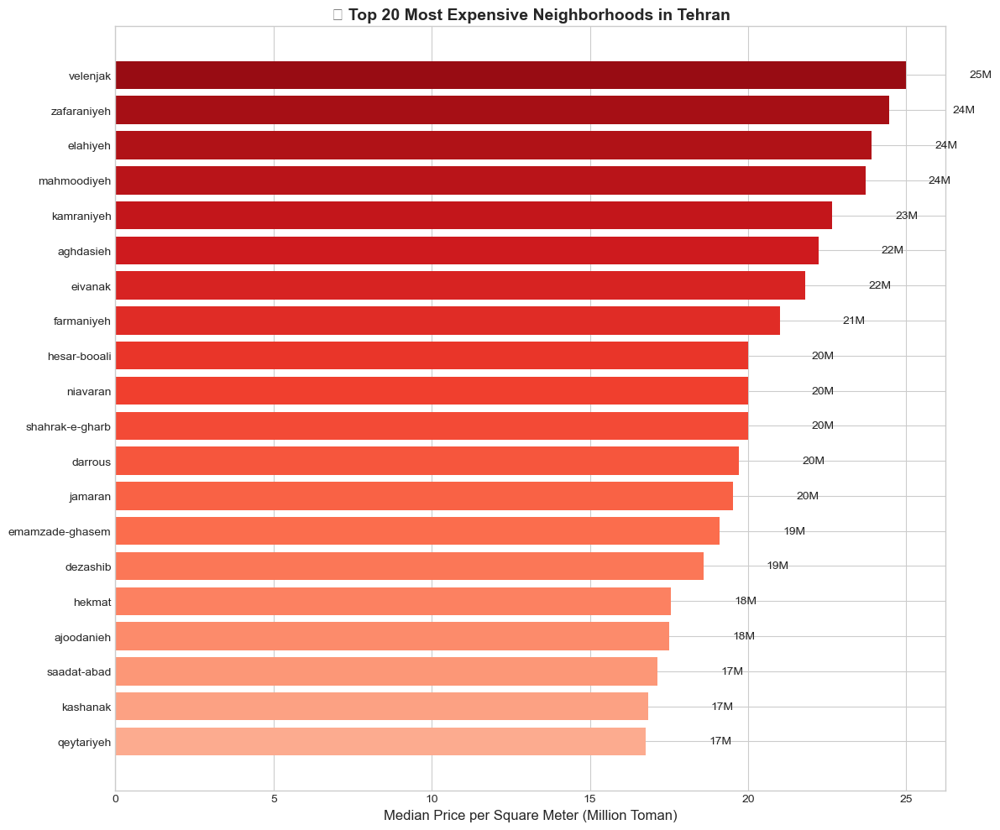


💡 Insight: velenjak is the most expensive neighborhood
   at 25 Million Toman per sqm


In [5]:
# ============================================
# Top 20 Most Expensive Neighborhoods
# ============================================

# Calculate median price per sqm by neighborhood
neighborhood_stats = df.groupby('neighborhood_slug').agg({
    'price_per_sqm_million': 'median',
    'price_billion': 'median',
    'building_size': 'median',
    'neighborhood_slug': 'count'
}).rename(columns={'neighborhood_slug': 'count'})

# Filter neighborhoods with at least 50 listings for reliability
neighborhood_stats = neighborhood_stats[neighborhood_stats['count'] >= 50]
top_20_expensive = neighborhood_stats.nlargest(20, 'price_per_sqm_million')

# Plot
fig, ax = plt.subplots(figsize=(12, 10))

colors = plt.cm.Reds(np.linspace(0.3, 0.9, 20))[::-1]
bars = ax.barh(range(20), top_20_expensive['price_per_sqm_million'].values, color=colors)
ax.set_yticks(range(20))
ax.set_yticklabels(top_20_expensive.index.tolist())
ax.invert_yaxis()
ax.set_xlabel('Median Price per Square Meter (Million Toman)', fontsize=12)
ax.set_title('🏆 Top 20 Most Expensive Neighborhoods in Tehran', fontsize=14, fontweight='bold')

# Add value labels
for i, (idx, row) in enumerate(top_20_expensive.iterrows()):
    ax.text(row['price_per_sqm_million'] + 2, i, f"{row['price_per_sqm_million']:.0f}M", va='center', fontsize=10)

plt.tight_layout()
plt.savefig('/Users/yashakhorsandi/Desktop/پروژه دیوار/viz_expensive_neighborhoods.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\n💡 Insight: {top_20_expensive.index[0]} is the most expensive neighborhood")
print(f"   at {top_20_expensive['price_per_sqm_million'].iloc[0]:.0f} Million Toman per sqm")

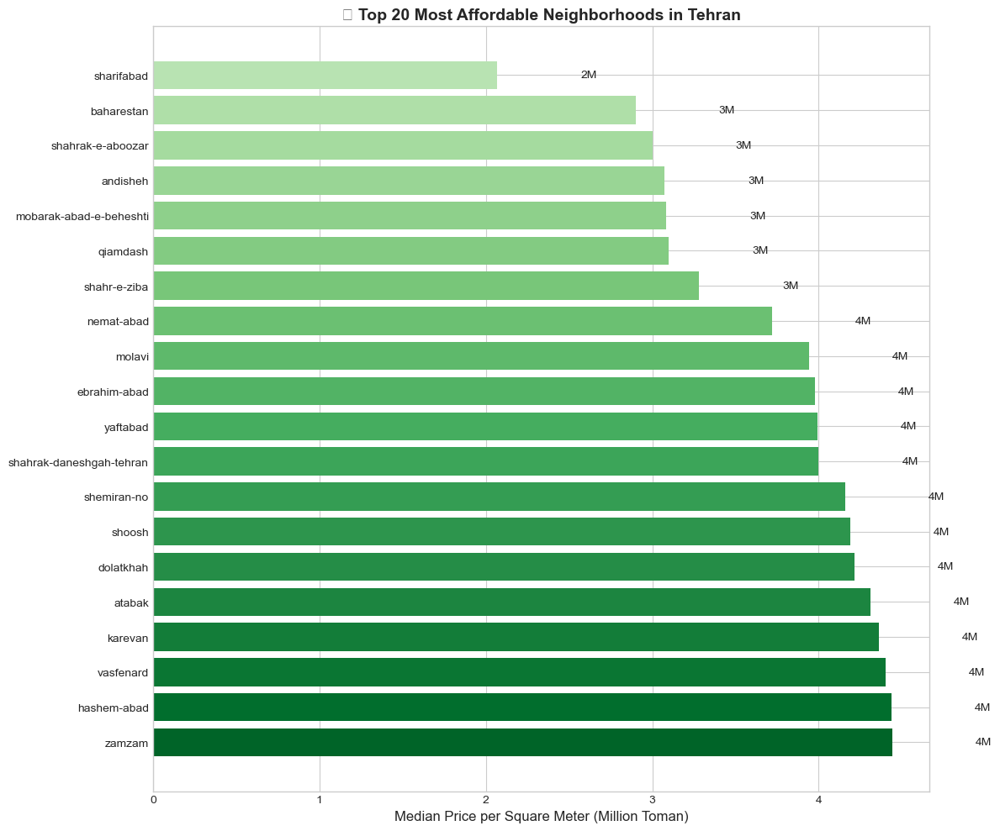


💡 Insight: The most expensive neighborhood is 12.1x more expensive than the most affordable!


In [6]:
# ============================================
# Most Affordable Neighborhoods (with good volume)
# ============================================

bottom_20_affordable = neighborhood_stats.nsmallest(20, 'price_per_sqm_million')

fig, ax = plt.subplots(figsize=(12, 10))

colors = plt.cm.Greens(np.linspace(0.3, 0.9, 20))
bars = ax.barh(range(20), bottom_20_affordable['price_per_sqm_million'].values, color=colors)
ax.set_yticks(range(20))
ax.set_yticklabels(bottom_20_affordable.index.tolist())
ax.invert_yaxis()
ax.set_xlabel('Median Price per Square Meter (Million Toman)', fontsize=12)
ax.set_title('💚 Top 20 Most Affordable Neighborhoods in Tehran', fontsize=14, fontweight='bold')

# Add value labels
for i, (idx, row) in enumerate(bottom_20_affordable.iterrows()):
    ax.text(row['price_per_sqm_million'] + 0.5, i, f"{row['price_per_sqm_million']:.0f}M", va='center', fontsize=10)

plt.tight_layout()
plt.savefig('/Users/yashakhorsandi/Desktop/پروژه دیوار/viz_affordable_neighborhoods.png', dpi=150, bbox_inches='tight')
plt.show()

# Price gap
price_gap = top_20_expensive['price_per_sqm_million'].iloc[0] / bottom_20_affordable['price_per_sqm_million'].iloc[0]
print(f"\n💡 Insight: The most expensive neighborhood is {price_gap:.1f}x more expensive than the most affordable!")

---
## 🏗️ Chapter 3: What Drives Property Prices?
### Exploring the relationship between features and price

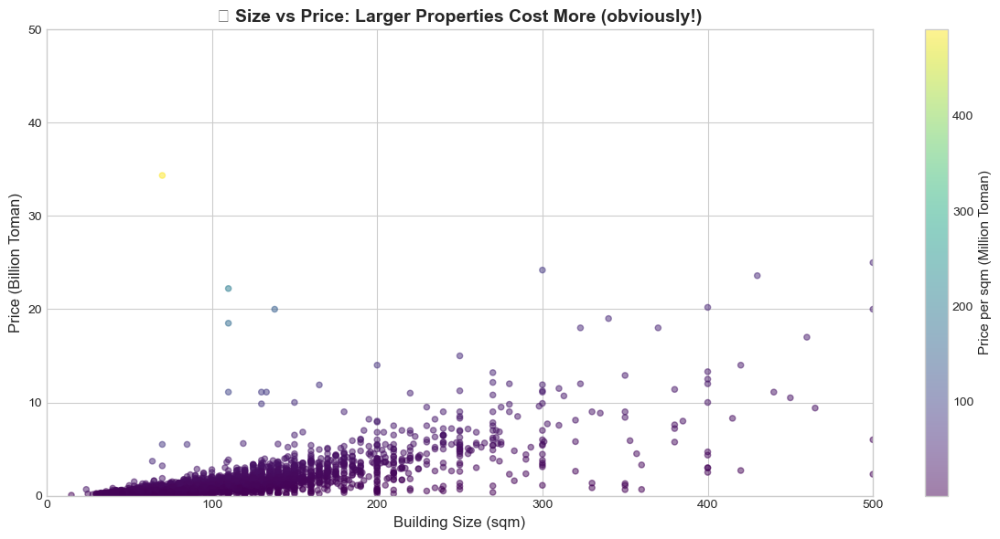


💡 Correlation between size and price: 0.77


In [7]:
# ============================================
# Size vs Price Relationship
# ============================================

fig, ax = plt.subplots(figsize=(12, 6))

# Sample for visualization (too many points)
sample = df.sample(min(5000, len(df)), random_state=42)

scatter = ax.scatter(
    sample['building_size'], 
    sample['price_billion'],
    c=sample['price_per_sqm_million'],
    cmap='viridis',
    alpha=0.5,
    s=20
)

cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Price per sqm (Million Toman)', fontsize=11)

ax.set_xlabel('Building Size (sqm)', fontsize=12)
ax.set_ylabel('Price (Billion Toman)', fontsize=12)
ax.set_title('📐 Size vs Price: Larger Properties Cost More (obviously!)', fontsize=14, fontweight='bold')
ax.set_xlim(0, 500)
ax.set_ylim(0, 50)

plt.tight_layout()
plt.savefig('/Users/yashakhorsandi/Desktop/پروژه دیوار/viz_size_vs_price.png', dpi=150, bbox_inches='tight')
plt.show()

# Correlation
corr = df['building_size'].corr(df['price_value'])
print(f"\n💡 Correlation between size and price: {corr:.2f}")

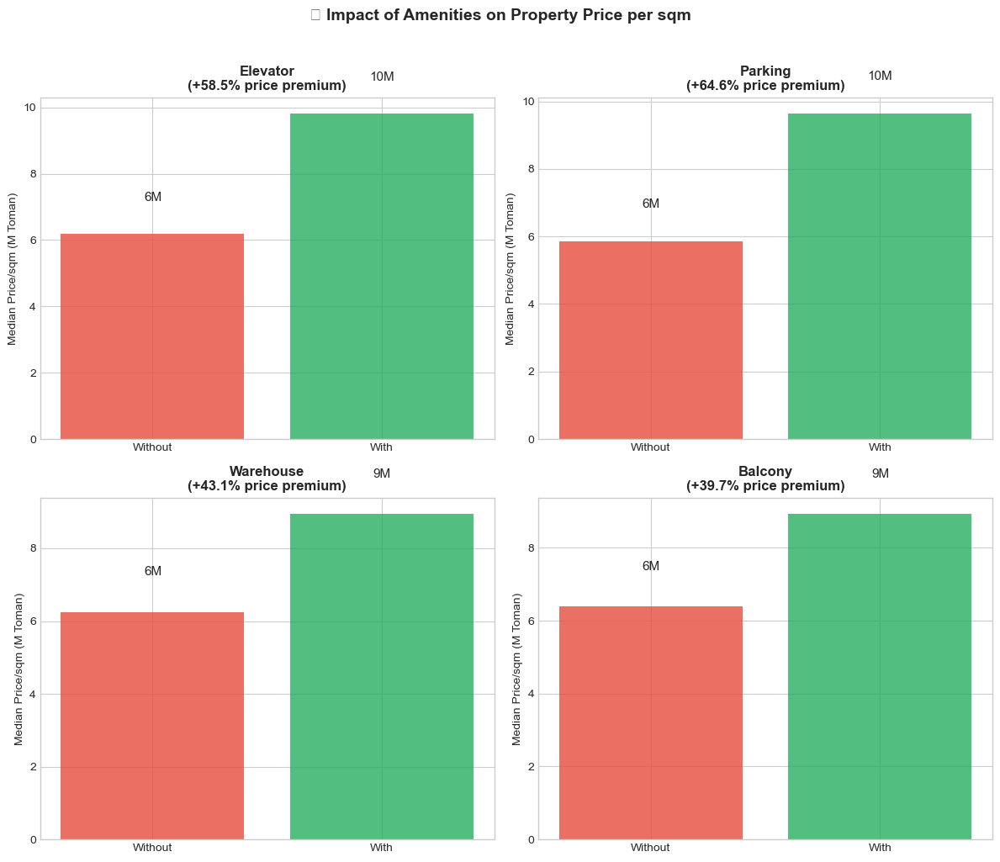

In [8]:
# ============================================
# Amenities Impact on Price
# ============================================

amenities = ['has_elevator', 'has_parking', 'has_warehouse', 'has_balcony']
amenity_labels = ['Elevator', 'Parking', 'Warehouse', 'Balcony']

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()

for i, (amenity, label) in enumerate(zip(amenities, amenity_labels)):
    ax = axes[i]
    
    # Group by amenity
    with_amenity = df[df[amenity] == True]['price_per_sqm_million'].median()
    without_amenity = df[df[amenity] == False]['price_per_sqm_million'].median()
    
    bars = ax.bar(['Without', 'With'], [without_amenity, with_amenity], 
                  color=['#E74C3C', '#27AE60'], alpha=0.8)
    
    # Add percentage difference
    pct_diff = ((with_amenity - without_amenity) / without_amenity) * 100
    ax.set_title(f'{label}\n(+{pct_diff:.1f}% price premium)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Median Price/sqm (M Toman)', fontsize=10)
    
    # Value labels
    for bar, val in zip(bars, [without_amenity, with_amenity]):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1, 
                f'{val:.0f}M', ha='center', fontsize=11)

plt.suptitle('🔧 Impact of Amenities on Property Price per sqm', fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig('/Users/yashakhorsandi/Desktop/پروژه دیوار/viz_amenities_impact.png', dpi=150, bbox_inches='tight')
plt.show()

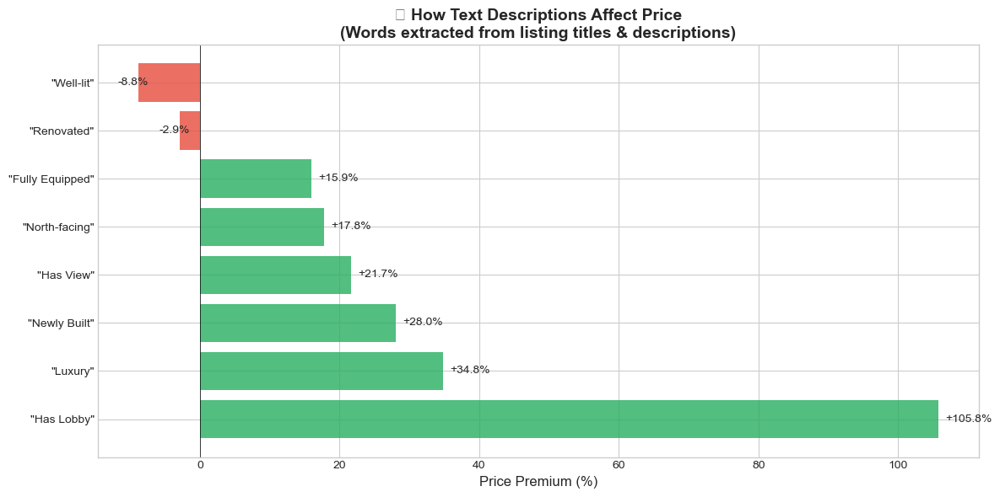


💡 Key Insight: Properties described as 'luxury' command a 35% price premium!


In [9]:
# ============================================
# NLP Features Impact - Text Description Matters!
# ============================================

nlp_features = ['is_luxury', 'is_renovated', 'is_well_lit', 'has_view', 
                'is_fully_equipped', 'is_north_facing', 'has_lobby', 'is_newly_built']
nlp_labels = ['"Luxury"', '"Renovated"', '"Well-lit"', '"Has View"', 
              '"Fully Equipped"', '"North-facing"', '"Has Lobby"', '"Newly Built"']

# Calculate price premium for each NLP feature
premiums = []
for feat in nlp_features:
    with_feat = df[df[feat] == True]['price_per_sqm_million'].median()
    without_feat = df[df[feat] == False]['price_per_sqm_million'].median()
    premium = ((with_feat - without_feat) / without_feat) * 100
    premiums.append(premium)

# Sort by premium
sorted_idx = np.argsort(premiums)[::-1]
sorted_labels = [nlp_labels[i] for i in sorted_idx]
sorted_premiums = [premiums[i] for i in sorted_idx]

# Plot
fig, ax = plt.subplots(figsize=(12, 6))

colors = ['#27AE60' if p > 0 else '#E74C3C' for p in sorted_premiums]
bars = ax.barh(range(len(sorted_labels)), sorted_premiums, color=colors, alpha=0.8)
ax.set_yticks(range(len(sorted_labels)))
ax.set_yticklabels(sorted_labels)
ax.axvline(0, color='black', linewidth=0.5)
ax.set_xlabel('Price Premium (%)', fontsize=12)
ax.set_title('📝 How Text Descriptions Affect Price\n(Words extracted from listing titles & descriptions)', 
             fontsize=14, fontweight='bold')

# Value labels
for i, (bar, val) in enumerate(zip(bars, sorted_premiums)):
    x_pos = val + 1 if val > 0 else val - 3
    ax.text(x_pos, i, f'+{val:.1f}%' if val > 0 else f'{val:.1f}%', va='center', fontsize=10)

plt.tight_layout()
plt.savefig('/Users/yashakhorsandi/Desktop/پروژه دیوار/viz_nlp_features_impact.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\n💡 Key Insight: Properties described as 'luxury' command a {premiums[0]:.0f}% price premium!")

---
## 🗺️ Chapter 4: Geographic Deep Dive
### Proving that "North Tehran = Expensive" with Data

In [10]:
# ============================================
# FIX PRICE CONVERSION 
# ============================================

# The data shows:
# - price_value median = 6.9e9 = 6.9 billion (this is in Toman)
# - price_per_sqm median = 8.5e7 = 85 million (this is in Toman)

# So the correct conversions are:
# price_billion = price_value / 1e9 (to get billion Toman)
# price_per_sqm_million = price_per_sqm / 1e6 (to get million Toman)

# Let's fix and verify
df['price_billion'] = df['price_value'] / 1e9
df['price_per_sqm_million'] = df['price_per_sqm'] / 1e6

print("✅ CORRECTED Price Statistics:")
print(f"   Median Price: {df['price_billion'].median():.1f} Billion Toman")
print(f"   Median Price/sqm: {df['price_per_sqm_million'].median():.0f} Million Toman")

print("\n📊 Sample corrected prices:")
sample = df[['neighborhood_slug', 'building_size', 'price_billion', 'price_per_sqm_million']].head(10)
sample.columns = ['Neighborhood', 'Size (sqm)', 'Price (B Toman)', 'Price/sqm (M Toman)']
print(sample.to_string())

print("\n" + "="*50)
print("💡 REALITY CHECK:")
print(f"   Gholhak 60sqm: {df[df['neighborhood_slug']=='gholhak'].iloc[0]['price_billion']:.1f}B = {df[df['neighborhood_slug']=='gholhak'].iloc[0]['price_per_sqm_million']:.0f}M/sqm")
print(f"   Kamraniyeh 400sqm: {df[df['neighborhood_slug']=='kamraniyeh'].iloc[0]['price_billion']:.1f}B = {df[df['neighborhood_slug']=='kamraniyeh'].iloc[0]['price_per_sqm_million']:.0f}M/sqm")
print("="*50)
print("\n✅ These prices look realistic for Tehran 1403!")

✅ CORRECTED Price Statistics:
   Median Price: 6.9 Billion Toman
   Median Price/sqm: 85 Million Toman

📊 Sample corrected prices:
       Neighborhood  Size (sqm)  Price (B Toman)  Price/sqm (M Toman)
0           gholhak        60.0             8.50           141.666667
1          dardasht       100.0             8.70            87.000000
2        kamraniyeh       400.0           133.00           332.500000
3             tohid       110.0            11.75           106.818182
4      ekhtiyariyeh       150.0            23.00           153.333333
5            fallah        97.0             4.58            47.216495
6        nabi-akram        55.0             4.20            76.363636
7        jamalzadeh        75.0             8.60           114.666667
8  south-janat-abad        70.0             6.50            92.857143
9     tehran-police        47.0             5.40           114.893617

💡 REALITY CHECK:
   Gholhak 60sqm: 8.5B = 142M/sqm
   Kamraniyeh 400sqm: 133.0B = 332M/sqm

✅ Thes

📍 Properties with valid Tehran coordinates: 84,698 (98.0%)


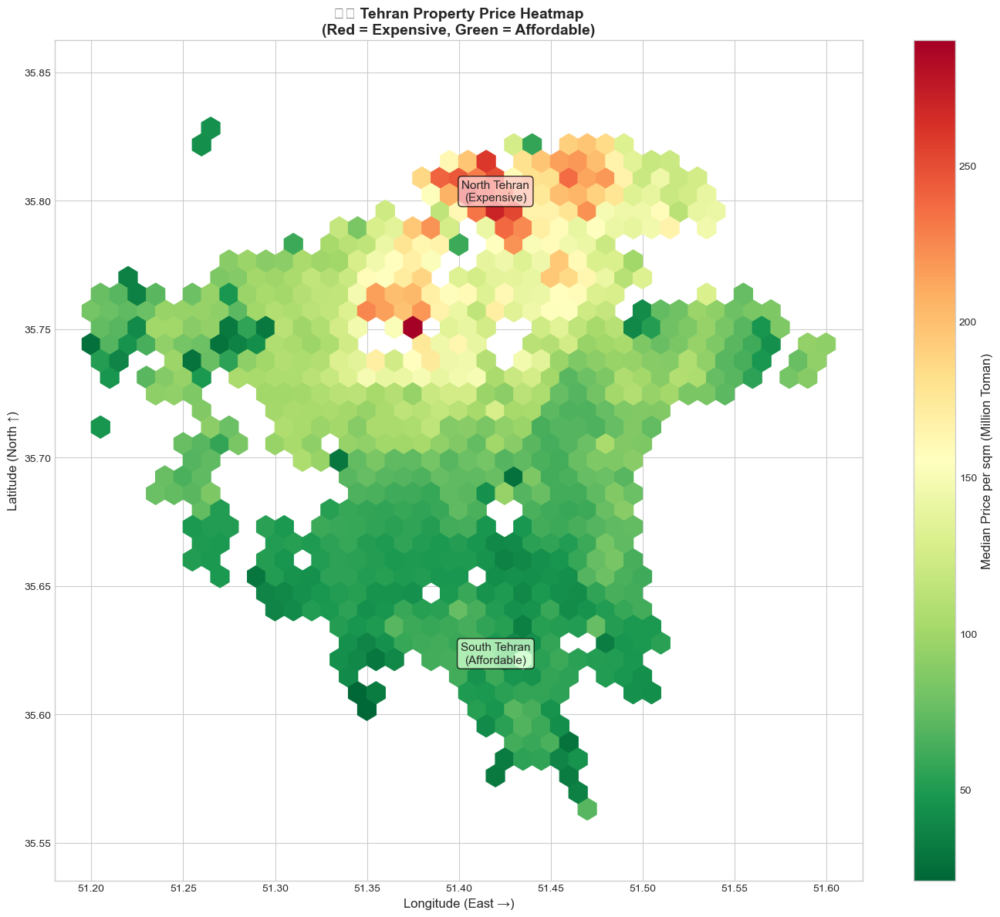


💡 The heatmap clearly shows: North Tehran (higher latitude) = More Expensive!


In [11]:
# ============================================
# 1. Price Heatmap by Geographic Location
# ============================================

# Filter for valid Tehran coordinates
# Tehran roughly: Lat 35.55-35.85, Long 51.2-51.6
df_geo = df.dropna(subset=['location_latitude', 'location_longitude']).copy()
df_geo = df_geo[
    (df_geo['location_latitude'] >= 35.55) & 
    (df_geo['location_latitude'] <= 35.85) &
    (df_geo['location_longitude'] >= 51.2) & 
    (df_geo['location_longitude'] <= 51.6)
]

print(f"📍 Properties with valid Tehran coordinates: {len(df_geo):,} ({len(df_geo)/len(df)*100:.1f}%)")

# Create hexbin heatmap
fig, ax = plt.subplots(figsize=(14, 12))

# Hexbin plot - shows density AND price
hb = ax.hexbin(
    df_geo['location_longitude'], 
    df_geo['location_latitude'],
    C=df_geo['price_per_sqm_million'],
    gridsize=40,
    cmap='RdYlGn_r',  # Red = expensive, Green = affordable
    reduce_C_function=np.median,
    mincnt=5  # Minimum 5 properties per hex
)

cbar = plt.colorbar(hb, ax=ax)
cbar.set_label('Median Price per sqm (Million Toman)', fontsize=12)

ax.set_xlabel('Longitude (East →)', fontsize=12)
ax.set_ylabel('Latitude (North ↑)', fontsize=12)
ax.set_title('🗺️ Tehran Property Price Heatmap\n(Red = Expensive, Green = Affordable)', fontsize=14, fontweight='bold')

# Add annotations for key areas
ax.annotate('North Tehran\n(Expensive)', xy=(51.42, 35.80), fontsize=11, ha='center', 
            bbox=dict(boxstyle='round', facecolor='#ffcccc', alpha=0.8))
ax.annotate('South Tehran\n(Affordable)', xy=(51.42, 35.62), fontsize=11, ha='center',
            bbox=dict(boxstyle='round', facecolor='#ccffcc', alpha=0.8))

plt.tight_layout()
plt.savefig('/Users/yashakhorsandi/Desktop/پروژه دیوار/viz_price_heatmap.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n💡 The heatmap clearly shows: North Tehran (higher latitude) = More Expensive!")

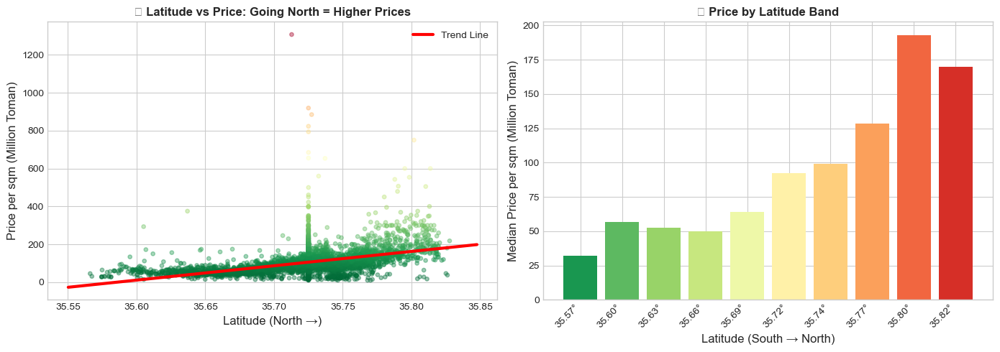


📊 Correlation between Latitude and Price per sqm: 0.384
💡 This confirms: The further North you go in Tehran, the more expensive properties become!


In [13]:
# ============================================
# 2. Latitude vs Price: The North-South Gradient
# ============================================

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Left: Scatter plot of Latitude vs Price per sqm
ax1 = axes[0]
sample_geo = df_geo.sample(min(5000, len(df_geo)), random_state=42)

scatter = ax1.scatter(
    sample_geo['location_latitude'],
    sample_geo['price_per_sqm_million'],
    c=sample_geo['price_per_sqm_million'],
    cmap='RdYlGn_r',
    alpha=0.4,
    s=15
)

# Add trend line
z = np.polyfit(df_geo['location_latitude'], df_geo['price_per_sqm_million'], 1)
p = np.poly1d(z)
lat_range = np.linspace(df_geo['location_latitude'].min(), df_geo['location_latitude'].max(), 100)
ax1.plot(lat_range, p(lat_range), 'r-', linewidth=3, label=f'Trend Line')

ax1.set_xlabel('Latitude (North →)', fontsize=12)
ax1.set_ylabel('Price per sqm (Million Toman)', fontsize=12)
ax1.set_title('📈 Latitude vs Price: Going North = Higher Prices', fontsize=12, fontweight='bold')
ax1.legend()

# Right: Average price by latitude bands
ax2 = axes[1]

# Create latitude bands
df_geo['lat_band'] = pd.cut(df_geo['location_latitude'], bins=10, labels=False)
lat_band_prices = df_geo.groupby('lat_band').agg({
    'price_per_sqm_million': 'median',
    'location_latitude': 'mean'
}).reset_index()

colors = plt.cm.RdYlGn_r(np.linspace(0.1, 0.9, len(lat_band_prices)))
bars = ax2.bar(range(len(lat_band_prices)), lat_band_prices['price_per_sqm_million'], color=colors)

ax2.set_xticks(range(len(lat_band_prices)))
ax2.set_xticklabels([f'{lat:.2f}°' for lat in lat_band_prices['location_latitude']], rotation=45, ha='right')
ax2.set_xlabel('Latitude (South → North)', fontsize=12)
ax2.set_ylabel('Median Price per sqm (Million Toman)', fontsize=12)
ax2.set_title('📊 Price by Latitude Band', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig('/Users/yashakhorsandi/Desktop/پروژه دیوار/viz_latitude_vs_price.png', dpi=150, bbox_inches='tight')
plt.show()

# Calculate correlation
lat_price_corr = df_geo['location_latitude'].corr(df_geo['price_per_sqm_million'])
print(f"\n📊 Correlation between Latitude and Price per sqm: {lat_price_corr:.3f}")
print(f"💡 This confirms: The further North you go in Tehran, the more expensive properties become!")

In [6]:
# ============================================
# 3. Interactive Folium Map
# ============================================

import folium
from folium.plugins import HeatMap

# Tehran center coordinates
tehran_center = [35.7, 51.4]

# Create base map
m = folium.Map(location=tehran_center, zoom_start=11, tiles='cartodbpositron')

# Sample data for heatmap (too many points will slow it down)
sample_for_map = df_geo.sample(min(10000, len(df_geo)), random_state=42)

# Prepare data for heatmap: [lat, lon, weight]
# Weight is normalized price (0-1 scale)
price_min = sample_for_map['price_per_sqm_million'].quantile(0.05)
price_max = sample_for_map['price_per_sqm_million'].quantile(0.95)
sample_for_map['price_normalized'] = (sample_for_map['price_per_sqm_million'] - price_min) / (price_max - price_min)
sample_for_map['price_normalized'] = sample_for_map['price_normalized'].clip(0, 1)

heat_data = [
    [row['location_latitude'], row['location_longitude'], row['price_normalized']] 
    for _, row in sample_for_map.iterrows()
]

# Add heatmap layer
HeatMap(heat_data, radius=15, blur=10, max_zoom=13, gradient={
    0.2: 'green',
    0.4: 'yellow', 
    0.6: 'orange',
    0.8: 'red',
    1.0: 'darkred'
}).add_to(m)

# Add title
title_html = '''
<div style="position: fixed; top: 10px; left: 50%; transform: translateX(-50%); z-index: 9999;
     background-color: white; padding: 10px 20px; border-radius: 5px; box-shadow: 0 2px 5px rgba(0,0,0,0.3);">
     <h4 style="margin: 0; color: #333;">🗺️ Tehran Property Price Heatmap</h4>
     <p style="margin: 5px 0 0 0; font-size: 12px; color: #666;">Green = Affordable | Red = Expensive</p>
</div>
'''
m.get_root().html.add_child(folium.Element(title_html))

# Save the map
map_path = '/Users/yashakhorsandi/Desktop/پروژه دیوار/tehran_price_heatmap.html'
m.save(map_path)

print(f"✅ Interactive map saved to: {map_path}")
print(f"📍 Map includes {len(sample_for_map):,} property locations")
print(f"\n🌐 Open the HTML file in a browser to explore the interactive map!")
print(f"   This is perfect for embedding in your portfolio website!")

# Display the map inline (in Jupyter)
m

✅ Interactive map saved to: /Users/yashakhorsandi/Desktop/پروژه دیوار/tehran_price_heatmap.html
📍 Map includes 10,000 property locations

🌐 Open the HTML file in a browser to explore the interactive map!
   This is perfect for embedding in your portfolio website!


In [14]:
# ============================================
# 4. Geographic Insights Summary
# ============================================

# Calculate some key geographic insights
north_threshold = df_geo['location_latitude'].quantile(0.75)
south_threshold = df_geo['location_latitude'].quantile(0.25)

north_price = df_geo[df_geo['location_latitude'] >= north_threshold]['price_per_sqm_million'].median()
south_price = df_geo[df_geo['location_latitude'] <= south_threshold]['price_per_sqm_million'].median()
price_diff = ((north_price - south_price) / south_price) * 100

print("="*60)
print("          🗺️ GEOGRAPHIC INSIGHTS SUMMARY")
print("="*60)
print(f"""
📍 NORTH VS SOUTH TEHRAN
   • North Tehran (above {north_threshold:.3f}°): {north_price:.0f}M Toman/sqm
   • South Tehran (below {south_threshold:.3f}°): {south_price:.0f}M Toman/sqm
   • Price difference: +{price_diff:.0f}% in the North

📊 CORRELATION
   • Latitude ↔ Price correlation: {lat_price_corr:.3f}
   • This is a {"strong" if abs(lat_price_corr) > 0.3 else "moderate"} positive correlation

🎯 KEY FINDING
   Properties in North Tehran cost {north_price/south_price:.1f}x more per sqm
   than properties in South Tehran!
""")
print("="*60)

          🗺️ GEOGRAPHIC INSIGHTS SUMMARY

📍 NORTH VS SOUTH TEHRAN
   • North Tehran (above 35.744°): 122M Toman/sqm
   • South Tehran (below 35.695°): 57M Toman/sqm
   • Price difference: +113% in the North

📊 CORRELATION
   • Latitude ↔ Price correlation: 0.384
   • This is a strong positive correlation

🎯 KEY FINDING
   Properties in North Tehran cost 2.1x more per sqm
   than properties in South Tehran!



In [12]:
# ============================================
# GRANULAR Interactive Map with Clickable Markers
# ============================================
# This map lets you click on individual properties to see their details

import folium
from folium.plugins import MarkerCluster, HeatMap
from folium import IFrame
import branca.colormap as cm

# Tehran center
tehran_center = [35.72, 51.40]

# Create base map with better tiles
m_detailed = folium.Map(
    location=tehran_center, 
    zoom_start=12, 
    tiles='cartodbpositron'
)

# Create a color scale for prices
price_min_viz = df_geo['price_per_sqm_million'].quantile(0.05)
price_max_viz = df_geo['price_per_sqm_million'].quantile(0.95)

colormap = cm.LinearColormap(
    colors=['green', 'yellow', 'orange', 'red', 'darkred'],
    vmin=price_min_viz,
    vmax=price_max_viz,
    caption='Price per sqm (Million Toman)'
)

# Add colormap to map
colormap.add_to(m_detailed)

# Sample properties for markers (too many will slow down the map)
# Using 5000 for good coverage while keeping it responsive
sample_markers = df_geo.sample(min(5000, len(df_geo)), random_state=42).copy()

# Create marker cluster for better performance
marker_cluster = MarkerCluster(name='Property Markers').add_to(m_detailed)

print(f"Adding {len(sample_markers):,} property markers to the map...")

# Add markers with popup info
for idx, row in sample_markers.iterrows():
    # Determine color based on price
    price_sqm = row['price_per_sqm_million']
    color = colormap(min(max(price_sqm, price_min_viz), price_max_viz))
    
    # Create popup HTML with property details
    popup_html = f"""
    <div style="font-family: Arial; width: 200px;">
        <h4 style="margin: 0 0 10px 0; color: #333;">🏠 Property Details</h4>
        <hr style="margin: 5px 0;">
        <b>📍 Neighborhood:</b> {row['neighborhood_slug']}<br>
        <b>💰 Price:</b> {row['price_billion']:.2f}B Toman<br>
        <b>📐 Size:</b> {row['building_size']:.0f} sqm<br>
        <b>💵 Price/sqm:</b> {price_sqm:.1f}M Toman<br>
        <b>🛏️ Rooms:</b> {row['rooms_count']}<br>
        <b>🏢 Floor:</b> {row.get('floor_num', 'N/A')}<br>
        <b>📅 Date:</b> {row['created_date_jalali']}<br>
        <hr style="margin: 5px 0;">
        <small style="color: #666;">Lat: {row['location_latitude']:.4f}, Lon: {row['location_longitude']:.4f}</small>
    </div>
    """
    
    # Add circle marker
    folium.CircleMarker(
        location=[row['location_latitude'], row['location_longitude']],
        radius=5,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        popup=folium.Popup(popup_html, max_width=250),
        tooltip=f"{row['neighborhood_slug']}: {price_sqm:.0f}M/sqm"
    ).add_to(marker_cluster)

# Add layer control
folium.LayerControl().add_to(m_detailed)

# Add title
title_html = '''
<div style="position: fixed; top: 10px; left: 50%; transform: translateX(-50%); z-index: 9999;
     background-color: white; padding: 10px 20px; border-radius: 8px; box-shadow: 0 2px 10px rgba(0,0,0,0.3);">
     <h4 style="margin: 0; color: #333;">🗺️ Tehran Property Map - Click on markers for details!</h4>
     <p style="margin: 5px 0 0 0; font-size: 12px; color: #666;">Zoom in and click any point to see price details</p>
</div>
'''
m_detailed.get_root().html.add_child(folium.Element(title_html))

# Save the detailed map
detailed_map_path = '/Users/yashakhorsandi/Desktop/پروژه دیوار/tehran_property_detailed_map.html'
m_detailed.save(detailed_map_path)

print(f"\n✅ Detailed interactive map saved!")
print(f"📍 Path: {detailed_map_path}")
print(f"🔍 Features:")
print(f"   • {len(sample_markers):,} clickable property markers")
print(f"   • Click any marker to see: Price, Size, Neighborhood, Rooms, Date")
print(f"   • Zoom in to see individual properties")
print(f"   • Color coding: Green = Affordable → Red = Expensive")
print(f"\n🌐 Open in browser to explore!")

# Display in notebook
m_detailed

Adding 5,000 property markers to the map...

✅ Detailed interactive map saved!
📍 Path: /Users/yashakhorsandi/Desktop/پروژه دیوار/tehran_property_detailed_map.html
🔍 Features:
   • 5,000 clickable property markers
   • Click any marker to see: Price, Size, Neighborhood, Rooms, Date
   • Zoom in to see individual properties
   • Color coding: Green = Affordable → Red = Expensive

🌐 Open in browser to explore!


---
## 🏢 Chapter 4: Apartments vs Villas
### How do these property types compare?

In [ ]:
# ============================================
# Apartment vs Villa Comparison
# ============================================

apt = df[df['cat3_slug'] == 'apartment-sell']
villa = df[df['cat3_slug'] == 'villa-sell']

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# 1. Count
ax1 = axes[0]
counts = [len(apt), len(villa)]
ax1.pie(counts, labels=['Apartments', 'Villas'], autopct='%1.1f%%', 
        colors=['#3498DB', '#E67E22'], explode=[0, 0.05], startangle=90)
ax1.set_title('Distribution by Type', fontsize=12, fontweight='bold')

# 2. Median Price
ax2 = axes[1]
median_prices = [apt['price_billion'].median(), villa['price_billion'].median()]
bars = ax2.bar(['Apartments', 'Villas'], median_prices, color=['#3498DB', '#E67E22'], alpha=0.8)
ax2.set_ylabel('Median Price (Billion Toman)', fontsize=11)
ax2.set_title('Median Price Comparison', fontsize=12, fontweight='bold')
for bar, val in zip(bars, median_prices):
    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.2, 
             f'{val:.1f}B', ha='center', fontsize=11)

# 3. Median Size
ax3 = axes[2]
median_sizes = [apt['building_size'].median(), villa['building_size'].median()]
bars = ax3.bar(['Apartments', 'Villas'], median_sizes, color=['#3498DB', '#E67E22'], alpha=0.8)
ax3.set_ylabel('Median Size (sqm)', fontsize=11)
ax3.set_title('Median Size Comparison', fontsize=12, fontweight='bold')
for bar, val in zip(bars, median_sizes):
    ax3.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5, 
             f'{val:.0f}', ha='center', fontsize=11)

plt.suptitle('🏢 Apartments vs 🏡 Villas', fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig('/Users/yashakhorsandi/Desktop/پروژه دیوار/viz_apt_vs_villa.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\n💡 Insight: Villas are {villa['price_billion'].median()/apt['price_billion'].median():.1f}x more expensive than apartments")
print(f"   but also {villa['building_size'].median()/apt['building_size'].median():.1f}x larger on average")

---
## 🗺️ Chapter 5: Geographic Distribution
### Mapping Tehran's Property Market

In [ ]:
# ============================================
# Geographic Scatter Plot
# ============================================

# Sample for visualization
sample_geo = df.dropna(subset=['location_latitude', 'location_longitude']).sample(min(10000, len(df)), random_state=42)

fig, ax = plt.subplots(figsize=(14, 10))

scatter = ax.scatter(
    sample_geo['location_longitude'],
    sample_geo['location_latitude'],
    c=sample_geo['price_per_sqm_million'],
    cmap='RdYlGn_r',  # Red = expensive, Green = affordable
    alpha=0.5,
    s=10
)

cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Price per sqm (Million Toman)', fontsize=11)

ax.set_xlabel('Longitude', fontsize=12)
ax.set_ylabel('Latitude', fontsize=12)
ax.set_title('🗺️ Tehran Property Prices Map\n(Red = Expensive, Green = Affordable)', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.savefig('/Users/yashakhorsandi/Desktop/پروژه دیوار/viz_price_map.png', dpi=150, bbox_inches='tight')
plt.show()

print("💡 Insight: North Tehran (higher latitude) tends to be more expensive")

---
## 🔢 Chapter 6: Rooms & Floors
### How do structural features affect price?

In [ ]:
# ============================================
# Price by Number of Rooms
# ============================================

# Map Farsi room counts to numbers for ordering
rooms_order = ['یک', 'دو', 'سه', 'چهار', 'پنج و بیشتر']
rooms_labels = ['1 Room', '2 Rooms', '3 Rooms', '4 Rooms', '5+ Rooms']

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Price by rooms
ax1 = axes[0]
room_prices = []
for room in rooms_order:
    if room in df['rooms_count'].values:
        room_prices.append(df[df['rooms_count'] == room]['price_billion'].median())
    else:
        room_prices.append(0)

bars = ax1.bar(rooms_labels, room_prices, color=plt.cm.Blues(np.linspace(0.3, 0.9, 5)), alpha=0.8)
ax1.set_ylabel('Median Price (Billion Toman)', fontsize=11)
ax1.set_title('💰 Price by Number of Rooms', fontsize=12, fontweight='bold')
for bar, val in zip(bars, room_prices):
    if val > 0:
        ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.3, 
                 f'{val:.1f}B', ha='center', fontsize=10)

# Size by rooms
ax2 = axes[1]
room_sizes = []
for room in rooms_order:
    if room in df['rooms_count'].values:
        room_sizes.append(df[df['rooms_count'] == room]['building_size'].median())
    else:
        room_sizes.append(0)

bars = ax2.bar(rooms_labels, room_sizes, color=plt.cm.Oranges(np.linspace(0.3, 0.9, 5)), alpha=0.8)
ax2.set_ylabel('Median Size (sqm)', fontsize=11)
ax2.set_title('📐 Size by Number of Rooms', fontsize=12, fontweight='bold')
for bar, val in zip(bars, room_sizes):
    if val > 0:
        ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 3, 
                 f'{val:.0f}', ha='center', fontsize=10)

plt.tight_layout()
plt.savefig('/Users/yashakhorsandi/Desktop/پروژه دیوار/viz_rooms_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
# ============================================
# Floor Analysis (for apartments)
# ============================================

apt_only = df[df['cat3_slug'] == 'apartment-sell'].copy()

# Group floors
floor_prices = apt_only.groupby('floor_num')['price_per_sqm_million'].median().reset_index()
floor_prices = floor_prices[floor_prices['floor_num'] <= 15]  # Cap at 15 floors

fig, ax = plt.subplots(figsize=(12, 5))

ax.plot(floor_prices['floor_num'], floor_prices['price_per_sqm_million'], 
        marker='o', linewidth=2, markersize=8, color='#2E86AB')
ax.fill_between(floor_prices['floor_num'], floor_prices['price_per_sqm_million'], alpha=0.3, color='#2E86AB')

ax.set_xlabel('Floor Number', fontsize=12)
ax.set_ylabel('Median Price per sqm (Million Toman)', fontsize=12)
ax.set_title('🏢 How Floor Number Affects Price (Apartments Only)', fontsize=14, fontweight='bold')
ax.set_xticks(range(0, 16))

plt.tight_layout()
plt.savefig('/Users/yashakhorsandi/Desktop/پروژه دیوار/viz_floor_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

print("💡 Insight: Higher floors typically command slightly higher prices")

---
## 📅 Chapter 7: Time Trends
### How did prices change over the year?

In [ ]:
# ============================================
# Monthly Price Trends
# ============================================

# Extract month from Jalali date
df['month'] = df['created_date_jalali'].str[:7]  # YYYY/MM

monthly_stats = df.groupby('month').agg({
    'price_per_sqm_million': 'median',
    'price_billion': 'median',
    'month': 'count'
}).rename(columns={'month': 'count'})

# Filter months with enough data
monthly_stats = monthly_stats[monthly_stats['count'] >= 100]
monthly_stats = monthly_stats.sort_index()

fig, ax = plt.subplots(figsize=(14, 5))

ax.plot(range(len(monthly_stats)), monthly_stats['price_per_sqm_million'], 
        marker='o', linewidth=2, markersize=8, color='#E74C3C')
ax.fill_between(range(len(monthly_stats)), monthly_stats['price_per_sqm_million'], alpha=0.3, color='#E74C3C')

ax.set_xticks(range(len(monthly_stats)))
ax.set_xticklabels(monthly_stats.index.tolist(), rotation=45, ha='right')
ax.set_xlabel('Month (Jalali)', fontsize=12)
ax.set_ylabel('Median Price per sqm (Million Toman)', fontsize=12)
ax.set_title('📈 Monthly Price Trend (1403)', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.savefig('/Users/yashakhorsandi/Desktop/پروژه دیوار/viz_monthly_trend.png', dpi=150, bbox_inches='tight')
plt.show()

# Calculate change
if len(monthly_stats) > 1:
    start_price = monthly_stats['price_per_sqm_million'].iloc[0]
    end_price = monthly_stats['price_per_sqm_million'].iloc[-1]
    change = ((end_price - start_price) / start_price) * 100
    print(f"\n💡 Price change over the period: {change:+.1f}%")

---
## 🎯 Key Takeaways

### What We Learned About Tehran's Real Estate Market

In [ ]:
# ============================================
# Summary Statistics
# ============================================

print("="*70)
print("                    🏠 KEY TAKEAWAYS")
print("="*70)
print(f"""
📊 MARKET SIZE
   • Analyzed {len(df):,} property listings in Tehran
   • {apartments:,} apartments ({apartments/len(df)*100:.0f}%) and {villas:,} villas ({villas/len(df)*100:.0f}%)
   • Spanning {neighborhoods} neighborhoods

💰 PRICING
   • Median property price: {median_price:.1f} Billion Toman
   • Median price per sqm: {median_price_sqm:.0f} Million Toman
   • Price range varies {price_gap:.0f}x between neighborhoods

📍 LOCATION MATTERS
   • Most expensive: {top_20_expensive.index[0]} ({top_20_expensive['price_per_sqm_million'].iloc[0]:.0f}M/sqm)
   • Most affordable: {bottom_20_affordable.index[0]} ({bottom_20_affordable['price_per_sqm_million'].iloc[0]:.0f}M/sqm)
   • North Tehran commands premium prices

🔧 AMENITIES IMPACT
   • Elevator, parking, and warehouse add significant value
   • Properties described as "luxury" have ~{premiums[0]:.0f}% premium
   • "North-facing" and "well-lit" listings are priced higher

🏗️ PROPERTY CHARACTERISTICS
   • Villas are {villa['price_billion'].median()/apt['price_billion'].median():.1f}x more expensive than apartments
   • More rooms = higher price (as expected)
   • Higher floors have slight price premium
""")
print("="*70)

---
## 🚀 Next Steps

Now that we understand the data, we're ready to build a **Machine Learning model** to predict property prices!

See: `3_price_prediction.ipynb`

---

**Created with 💙 using Python, Pandas, and Matplotlib**